In [ ]:
%load_ext tensorboard

In [ ]:
import tensorflow as tf
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
import csv
import pandas as pd
from tqdm import tqdm
import time
import os
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
import datetime
import matplotlib.pyplot as plt

seed = 9

np.random.seed(seed)
tf.random.set_seed(seed)

In [ ]:
TEST_SIZE = 0.25
EPOCHS = 50

In [ ]:
dataset = pd.read_csv("group1_hit_songs_dataset_ml_5.csv")

In [ ]:
dataset

,hitness,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,popularity,sentiment
0,True,0.841,0.728,7,-3.370,1,0.0484,0.0847,0.0,0.1490,0.430,130.049,243837,4,17532.333333,0.9938
1,True,0.336,0.627,7,-7.463,1,0.0384,0.1640,0.0,0.0708,0.350,150.273,241107,4,2772.142857,0.9805
2,True,0.589,0.472,8,-8.749,1,0.0502,0.6140,0.0,0.5050,0.898,67.196,126267,4,410.000000,0.9868
3,True,0.754,0.424,2,-8.463,1,0.0363,0.6430,0.0,0.0652,0.806,119.705,130973,4,281.000000,0.8442
4,True,0.683,0.375,0,-13.056,1,0.0303,0.5790,0.0,0.0760,0.888,140.467,135533,4,1169.000000,0.9966
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4436,False,0.578,0.647,7,-6.031,0,0.0677,0.3870,0.0,0.0862,0.414,87.932,197560,1,9947.272727,0.9949
4437,False,0.630,0.782,8,-5.440,0,0.1320,0.0828,0.0,0.0340,0.418,140.144,247947,4,6836.444444,-0.9879
4438,False,0.216,0.473,7,-6.237,1,0.0293,0.7660,0.0,0.0933,0.132,157.597,251387,4,14813.545455,0.9490
4439,False,0.675,0.855,4,-3.876,0,0.0330,0.0134,0.0,0.0898,0.909,94.008,193627,4,612.000000,-0.9825


In [ ]:
header = []
features = []
labels = []

for feature in dataset.loc[:, ~dataset.columns.isin(["hitness"])].iterrows():
  header = list(feature[1].keys())
  features.append(feature[1])

for label in dataset.loc[:, dataset.columns.isin(["hitness"])].iterrows():
  labels.append(label[1])

features = np.asarray(features)
labels = np.asarray(labels)

x_train, x_test, y_train, y_test = train_test_split(np.array(features), np.array(tf.keras.utils.to_categorical(labels)), test_size=TEST_SIZE, random_state=42)

In [ ]:
rf = RandomForestRegressor(n_estimators=1000, random_state=seed)
rf.fit(x_train, y_train)

RandomForestRegressor(n_estimators=1000, random_state=9)

In [ ]:
y_pred_rf = rf.predict(x_test)
print("Accuracy", metrics.accuracy_score(y_test, np.round(y_pred_rf)))

Accuracy 0.6084608460846085


In [ ]:
importances = list(rf.feature_importances_)
feature_importances = [(feature, round(importance, 4)) for feature, importance in zip(header, importances)]
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)

[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: popularity           Importance: 0.1252
Variable: duration_ms          Importance: 0.0909
Variable: speechiness          Importance: 0.0878
Variable: sentiment            Importance: 0.0819
Variable: valence              Importance: 0.0803
Variable: acousticness         Importance: 0.0778
Variable: danceability         Importance: 0.0766
Variable: liveness             Importance: 0.0759
Variable: tempo                Importance: 0.0754
Variable: energy               Importance: 0.0712
Variable: loudness             Importance: 0.0703
Variable: key                  Importance: 0.0372
Variable: instrumentalness     Importance: 0.0366
Variable: mode                 Importance: 0.0085
Variable: time_signature       Importance: 0.0046


In [ ]:
fig, axes = plt.subplots(figsize = (80, 40), dpi=200)
sklearn.tree.plot_tree(rf.estimators_[1],
                feature_names=header, 
                class_names="hitness",
                filled=True,
                rounded=True);

    #axes[index].set_title('Estimator: ' + str(index), fontsize = 9)

fig.savefig("rf_5trees_1.png", transparent=True)

In [ ]:
lr = LogisticRegression()
lr.fit(x_train, np.argmax(y_train, axis=1))

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


LogisticRegression()

In [ ]:
score = lr.score(x_test, np.argmax(y_test, axis=1))
score

0.6111611161116112

In [ ]:
f = t = 0
for y in y_test:
  if np.argmax(y):
    t += 1
  else:
    f += 1

print(f, t)
print(f / (f + t))

585 526
0.5265526552655265


In [ ]:
model = tf.keras.models.Sequential([
  tf.keras.layers.InputLayer(15),

  tf.keras.layers.Dense(1000, activation="relu"),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1000, activation="relu"),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1000, activation="relu"),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1000, activation="relu"),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1000, activation="relu"),

  tf.keras.layers.Dense(2, activation="sigmoid")
])

model.compile(
  optimizer=tf.keras.optimizers.Adam(),
  loss="binary_crossentropy",
  metrics=["accuracy"]
)

"""
  tf.keras.layers.Dense(100, activation="relu"),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(100, activation="relu"),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(100, activation="relu"),
"""

'\n  tf.keras.layers.Dense(100, activation="relu"),\n  tf.keras.layers.Dropout(0.2),\n  tf.keras.layers.Dense(100, activation="relu"),\n  tf.keras.layers.Dropout(0.2),\n  tf.keras.layers.Dense(100, activation="relu"),\n'

In [ ]:
log_dir = "logs/fit1/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
model.fit(x_train, y_train, epochs=EPOCHS, batch_size=32, validation_split = 0.2, callbacks=[tensorboard_callback])

print()
model.evaluate(x_test, y_test, verbose=1)

Epoch 1/50
84/84 [==============================] - 2s 10ms/step - loss: 591.5323 - accuracy: 0.5045 - val_loss: 6.7678 - val_accuracy: 0.5180
Epoch 2/50
84/84 [==============================] - 1s 8ms/step - loss: 13.7833 - accuracy: 0.5008 - val_loss: 1.0658 - val_accuracy: 0.4925
Epoch 3/50
84/84 [==============================] - 1s 8ms/step - loss: 3.1775 - accuracy: 0.5019 - val_loss: 0.7231 - val_accuracy: 0.5075
Epoch 4/50
84/84 [==============================] - 1s 8ms/step - loss: 0.9917 - accuracy: 0.5169 - val_loss: 0.7055 - val_accuracy: 0.5180
Epoch 5/50
84/84 [==============================] - 1s 8ms/step - loss: 0.8191 - accuracy: 0.5270 - val_loss: 0.6914 - val_accuracy: 0.5180
Epoch 6/50
84/84 [==============================] - 1s 8ms/step - loss: 0.7707 - accuracy: 0.5342 - val_loss: 0.6926 - val_accuracy: 0.5180
Epoch 7/50
84/84 [==============================] - 1s 8ms/step - loss: 0.7514 - accuracy: 0.5270 - val_loss: 0.6902 - val_accuracy: 0.5180
Epoch 8/50
84/84

[0.6895313262939453, 0.5427542924880981]

In [ ]:
%tensorboard --logdir logs/fit1

<IPython.core.display.Javascript object>

In [ ]:
print(tf.math.confusion_matrix(y_test, np.round(model.predict(x_test))))
print("Accuracy", metrics.accuracy_score(y_test, np.round(model.predict(x_test))))
model.evaluate(x_test, y_test)

tf.Tensor(
[[   2 1212]
 [1090    0]], shape=(2, 2), dtype=int32)
Accuracy 0.6041666666666666
36/36 [==============================] - 0s 2ms/step - loss: 0.6599 - accuracy: 0.6050


[0.6598904132843018, 0.6050347089767456]

In [ ]:
print(tf.math.confusion_matrix(y_test, np.round(rf.predict(x_test))))
print("Accuracy", metrics.accuracy_score(y_test, np.round(rf.predict(x_test))))

tf.Tensor(
[[   6 1019]
 [1279    0]], shape=(2, 2), dtype=int32)
Accuracy 0.6137152777777778


In [ ]:
f = t = 0
for y in np.round(model.predict(x_test)):
  if np.argmax(y):
    t += 1
  else:
    f += 1

print(f, t)
print(f / (f + t))

289 863
0.2508680555555556


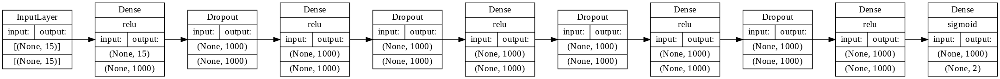

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file='model.png',
    show_shapes=True,
    show_layer_names=False,
    rankdir='LR',
    expand_nested=False,
    dpi=100,
    layer_range=None,
    show_layer_activations=True
)